# Гиперболические уравнения

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from tqdm import tqdm_notebook as tqdm
from IPython.display import clear_output, HTML

## Задача Коши для одномерного уравнения переноса

$$
\begin{cases}
u_t + a u_x = f(u, x, t) \\
u(x, t_0) = u_{init}(x) \\
u(x_0, t) = u_0(t) \\
u(x_1, t) = u_1(t)
\end{cases}
$$

### Схема Куранта-Изаксона-Риса ("уголок" с переключением)

$$
\begin{cases}
\dfrac{u_{i}^{k+1} - u_{i}^{k}}{\Delta t} + \min(a, 0) \dfrac{u_{i + 1}^{k} - u_{i}^{k}}{\Delta x} + \max(a, 0) \dfrac{u_{i}^{k} - u_{i - 1}^{k}}{\Delta x} = f(u_{i}^{k}, x_i, t^k) \\
u_{i}^{0} = u_{init}(x_i) \\
u_{0}^{k} = u_{0}(t_k) \\
u_{I}^{k} = u_{1}(t_k)
\end{cases}
$$
Зависимость между $\Delta x$ и $\Delta t$ задаёт условие Куранта:
$$
C = |a| \frac{\Delta t}{\Delta x} \le 1
$$

In [2]:
def KIR(x0, x1, nx, t0, t1, C, a, f, U_init, U0, U1):
    dx = (x1 - x0) / (nx - 1)
    dt = dx * C / abs(a)
    nt = int((t1 - t0) / dt) + 2

    x = np.linspace(x0, x1, nx)
    U = np.zeros((nt, nx))
    U[0] = U_init(x)

    for i in range(nt - 1):
        t = t0 + i * nt
        if a > 0:
            U[i,0] = U0(t)
            U[i+1,1:] = U[i,1:] - dt * (a * (U[i,1:] - U[i,:-1]) / dx - f(U[i,1:], x[1:], t))
        else:
            U[i+1,:-1] = U[i,:-1] - dt * (a * (U[i,1:] - U[i,:-1]) / dx - f(U[i,:-1], x[:-1], t))
            U[i,-1] = U1(t)
    return U

In [3]:
U = KIR(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 1, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

In [4]:
def animate(U, x0, x1):
    x = np.linspace(x0, x1, U.shape[1])
    def animate(data):
        y = data
        line.set_data(x,y)
        return line,

    fig = plt.figure();
    ax = plt.axes(xlim=(x0, x1), ylim=(U.min(), U.max()), xlabel=('$x$'), ylabel=('$u(x)$'));
    line, = plt.plot([],[]);

    return animation.FuncAnimation(fig, animate, frames=U, interval=100);

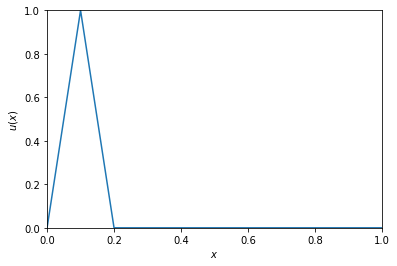

In [5]:
anim = animate(U, 0, 1)

In [6]:
HTML(anim.to_jshtml())

Неустойчивое решение ($C > 1$):

In [7]:
U = KIR(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 1.03, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

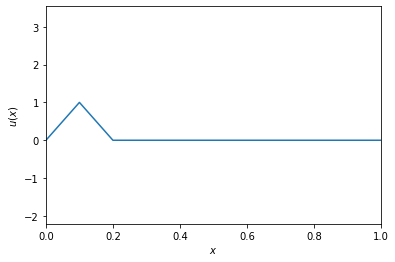

In [8]:
anim = animate(U, 0, 1)

In [9]:
HTML(anim.to_jshtml())

Высокая численная вязкость (C < 1):

In [10]:
U = KIR(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 0.2, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

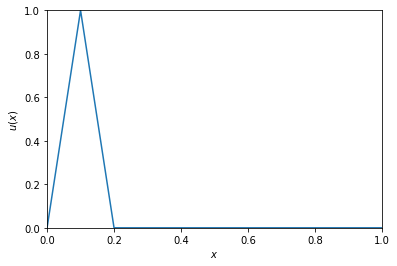

In [11]:
anim = animate(U, 0, 1)

In [12]:
HTML(anim.to_jshtml())

Задачи:

1. Попробовать вместо "уголков" аппроксимировать производную по x через центральные разности. Какими свойствами обладает такая разностная схема?
2. Построить график зависимости между $С > 1$ и $\log \max_x|U(x, t)|$ для различных начальных условий.
3. Для решения с высокой численной вязкостью построить график $I(t) = \int_{x0}^{x1} U(x, t) dx$
4. ***** Попробовать подобрать нетривиальное НУ $U(x, 0)$, для которого полученное устойчивое решение $U(x, t)$ не будет зависеть от численной вязкости.

### Схема Лакса-Вендроффа

[Схема Лакса-Вендроффа](https://en.wikipedia.org/wiki/Lax%E2%80%93Wendroff_method) имеет второй порядок аппроксимации, однако является немонотонной.
$$
\begin{cases}
\dfrac{u_{i}^{k+1} - u_{i}^{k}}{\Delta t} + a \dfrac{u_{i + 1}^{k} - u_{i - 1}^{k}}{2 \Delta x} - \dfrac{a^2}{2} \Delta t \dfrac{u_{i + 1}^{k} - 2 u_{i}^{k}  + u_{i - 1}^{k}}{\Delta x ^ 2} = f(u_{i}^{k}, x_i, t^k) \\
u_{i}^{0} = u_{init}(x_i) \\
u_{0}^{k} = u_{0}(t_k) \\
u_{I}^{k} = u_{1}(t_k)
\end{cases}
$$

In [13]:
def LW(x0, x1, nx, t0, t1, C, a, f, U_init, U0, U1):
    dx = (x1 - x0) / (nx - 1)
    dt = dx * C / abs(a)
    nt = int((t1 - t0) / dt) + 2

    x = np.linspace(x0, x1, nx)
    U = np.zeros((nt, nx))
    U[0] = U_init(x)

    for i in range(nt - 1):
        t = t0 + i * nt
        U[i,0] = U0(t)
        U[i+1,1:-1] = U[i,1:-1] - dt * a * (U[i,2:] - U[i,:-2]) / (2 * dx) + \
                      0.5 * dt ** 2 * a ** 2 * (U[i,2:] - 2 * U[i,1:-1] + U[i,:-2]) / dx ** 2 - \
                      dt * f(U[i,1:-1], x[1:-1], t)
        U[i,-1] = U1(t)
        
    return U

In [14]:
U = LW(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 1, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

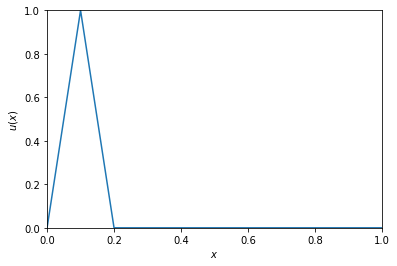

In [15]:
anim = animate(U, 0, 1)

In [16]:
HTML(anim.to_jshtml())

Высокая численная вязкость + немонотонность схемы:

In [17]:
U = LW(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 0.2, # Число Куранта
    a = 0.8, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

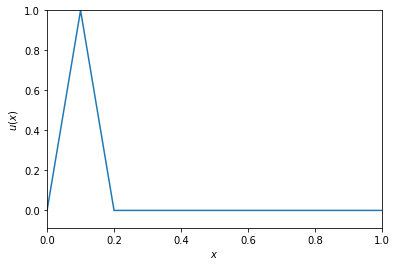

In [18]:
anim = animate(U, 0, 1)

In [19]:
HTML(anim.to_jshtml())

Задачи:


5. Очевидно, что схемы в текущей реализации можно расширить на случай $a = a(t)$. Рассчитать случай $a = \sin 2\pi t$

6. Рассмотреть случаи $a = a(x,t)$ и $a = a(u, x, t)$

7. Рассмотреть задачи Коши, для которых известно точное решение, сравнить ошибку (максимум отклонения и квадратичную ошибку) для рассмотренных методов для различных nx. Для одинаковых C (совпадает шаг по времени) построить анимацию ошибки.

8. Согласно [теореме Годунова](https://en.wikipedia.org/wiki/Godunov's_theorem), любые линейные разностные схемы для уравнений переноса выше первого порядка аппроксимации являются или немонотонными, или всюду неустойчивыми. Для решения этой проблемы используются различные гибридные схемы. Примером такой схемы является схема Федоренко (см. п. XIV.2.5 в книжке Аристовой, Лобанова). Задача: реализовать cхему Федоренко, построить графики, сравнить ошибку с предыдущими методами.

9. Реализовать одну из разобранных схем для волнового уравнения $u_{tt} = a^2 u_{xx}$ (сначала привести к системе первого порядка).

10. Реализовать одну из разобранных схем для двумерного уравнения переноса $u_{t} + a u_{x} + b u_{y} = f(u, x, y, t)$. Подсказки:
    1. можно использовать $\Delta t = C \dfrac{\min(\Delta x, \Delta y)}{\max(|a|, |b|)}$
    2. для простой ортогональной сетки можно использовать [`np.meshgrid`](https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html?highlight=meshgrid#numpy.meshgrid) (вот [пример](https://matplotlib.org/3.2.1/gallery/images_contours_and_fields/contourf_demo.html#sphx-glr-gallery-images-contours-and-fields-contourf-demo-py) использования вместе с Matplotlib для отрисовки двумерных функций)